# Importing Yolo and Midas Layers

In [1]:
from yolo_model import *
yolo_model = get_yolo()

d:\Python Projects\EVA\15_TheCapStone\models_all\YoloV3
Now adding layers
Model Summary: 60 layers, 1.5916e+07 parameters, 1.5916e+07 gradients


In [2]:
from midas_model import *
midas_model = get_midas()

d:\Python Projects\EVA\15_TheCapStone\models_all\YoloV3
d:\Python Projects\EVA\15_TheCapStone\models_all
Loading weights:  D:\Python Projects\EVA\15_TheCapStone\models_all\midas\model-f6b98070.pt
Using cache found in C:\Users\BlueFlames/.cache\torch\hub\facebookresearch_WSL-Images_master
Path D:\Python Projects\EVA\15_TheCapStone\models_all\midas\model-f6b98070.pt


In [3]:
from model_ensemble import *
model = MyEnsemble(midas_model, yolo_model).to("cuda")

# Summary Ensemble Model

In [4]:
from torchsummary import summary
summary(model, input_size=(3,416,416))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 208, 208]           9,408
       BatchNorm2d-2         [-1, 64, 208, 208]             128
              ReLU-3         [-1, 64, 208, 208]               0
         MaxPool2d-4         [-1, 64, 104, 104]               0
            Conv2d-5        [-1, 256, 104, 104]          16,384
       BatchNorm2d-6        [-1, 256, 104, 104]             512
              ReLU-7        [-1, 256, 104, 104]               0
            Conv2d-8        [-1, 256, 104, 104]          18,432
       BatchNorm2d-9        [-1, 256, 104, 104]             512
             ReLU-10        [-1, 256, 104, 104]               0
           Conv2d-11        [-1, 256, 104, 104]          65,536
      BatchNorm2d-12        [-1, 256, 104, 104]             512
           Conv2d-13        [-1, 256, 104, 104]          16,384
      BatchNorm2d-14        [-1, 256, 1

In [5]:
PATH = r"D:\Python Projects\EVA\15_TheCapStone\ensemble.h5"
# torch.save(model.state_dict(), PATH)

In [6]:
# If pretrained model exists
import os
if os.path.exists(PATH):
    model.load_state_dict(torch.load(PATH))


# Generating Yolo Outputs via Inferencing Pre-trained Model

In [7]:
from inference_yolo import *

In [8]:
yolo_detect(model)

image 1/35 D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test\01-prince-boots - Copy.jpg: Results saved to D:\Python Projects\EVA\15_TheCapStone\models_all\YoloV3\D:\Python Projects\EVA\15_TheCapStone\custom_data\output\Yolo_Output
image 2/35 D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test\05a207d8-6378-43a2-9d1e-431ca7a944e4-unnamed - Copy.jpg: Results saved to D:\Python Projects\EVA\15_TheCapStone\models_all\YoloV3\D:\Python Projects\EVA\15_TheCapStone\custom_data\output\Yolo_Output
image 3/35 D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test\0b59d3bd16.jpg: Results saved to D:\Python Projects\EVA\15_TheCapStone\models_all\YoloV3\D:\Python Projects\EVA\15_TheCapStone\custom_data\output\Yolo_Output
image 4/35 D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test\1-embed-activewear.jpg: Results saved to D:\Python Projects\EVA\15_TheCapStone\models_all\YoloV3\D:\Python Projects\EVA\15_TheCapStone\custom_data\output\Yolo_Output
image 5/35 D:\P

# Generating Midas Output

In [9]:
from inference_midas import *

def inference_midas_model():
    INPUT_PATH = r"D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test"
    OUTPUT_PATH = r"D:\Python Projects\EVA\15_TheCapStone\custom_data\output\Midas_Output"
    # MODEL_PATH = "model.pt"

    # set torch options
    torch.backends.cudnn.enabled = True
    torch.backends.cudnn.benchmark = True

    # compute depth maps - Outputs will be stored in the data\midas_output folder
    run(INPUT_PATH, OUTPUT_PATH, model)

In [10]:
inference_midas_model()

initialize
device: cuda
start processing
  processing D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test\01-prince-boots - Copy.jpg (1/35)
  processing D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test\05a207d8-6378-43a2-9d1e-431ca7a944e4-unnamed - Copy.jpg (2/35)
  processing D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test\0b59d3bd16.jpg (3/35)
  processing D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test\1-embed-activewear.jpg (4/35)
  processing D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test\1.jpg (5/35)
  processing D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test\1ca8a4bb9a.jpg (6/35)
  processing D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test\1da89aacd2.jpg (7/35)
  processing D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test\1f839e7d39.jpg (8/35)
  processing D:\Python Projects\EVA\15_TheCapStone\custom_data\images_test\1_IT_1599021257624 - Copy.jpeg (9/35)
  processing D:\Py

# Output Generated by Model

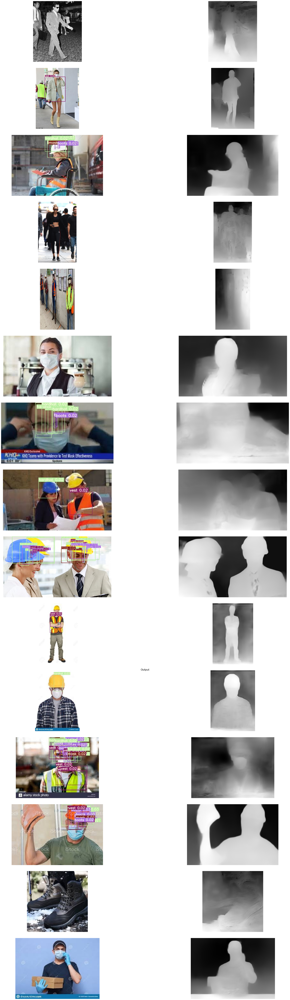

In [11]:
import cv2
fig, axs = plt.subplots(nrows=15, ncols=2, figsize=(30,30))
fig.suptitle("Output", fontsize=16)
yolo_output_dir = r"D:\Python Projects\EVA\15_TheCapStone\custom_data\output\Yolo_Output\*.jpg"

list_images = glob.glob(yolo_output_dir)

for image_idx, image in enumerate(list_images):
    yolo_output = cv2.imread(image)

    midas_output = cv2.imread(str(image).replace('Yolo_Output', 'Midas_Output').replace('jpg', 'png'))

    axs[image_idx, 0].imshow(cv2.cvtColor(yolo_output, cv2.COLOR_BGR2RGB))
    axs[image_idx, 0].axis('off')
    # axs[image_idx, 0]

    # axs[image_idx, 0].set_title('Midas Output')
    axs[image_idx, 1].imshow(midas_output)
    axs[image_idx, 1].axis('off')
    if image_idx  > 13:
        break

plt.tight_layout()
plt.subplots_adjust(top=2.95, wspace=0.1, hspace=0.1)
plt.show()
# plt.savefig('gradcam.png')